# Regression Problem

House Price Prediction Using ANN



In [1]:
# Load the data
import pandas as pd
df=pd.read_csv("boston.csv")

In [2]:
df.head()

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,HOUSEPRICE
0,0.00632,18.0,2.31,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [ ]:
# Automate the EDA process

!pip install ydata-profiling

# EDA

In [4]:
from ydata_profiling import ProfileReport

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# separating outcome and features
x=df.drop(columns='HOUSEPRICE')
y=df.HOUSEPRICE

# split the data into train and test
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0)

#Standardise data
from sklearn.preprocessing import StandardScaler
st=StandardScaler()
x_train_std=st.fit_transform(x_train)
x_test_std=st.fit_transform(x_test)

In [8]:
x_train_std.shape

(379, 12)

In [ ]:
!pip install livelossplot

In [14]:
# Build the model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense
from livelossplot import PlotLossesKerasTF
import tensorflow as tf

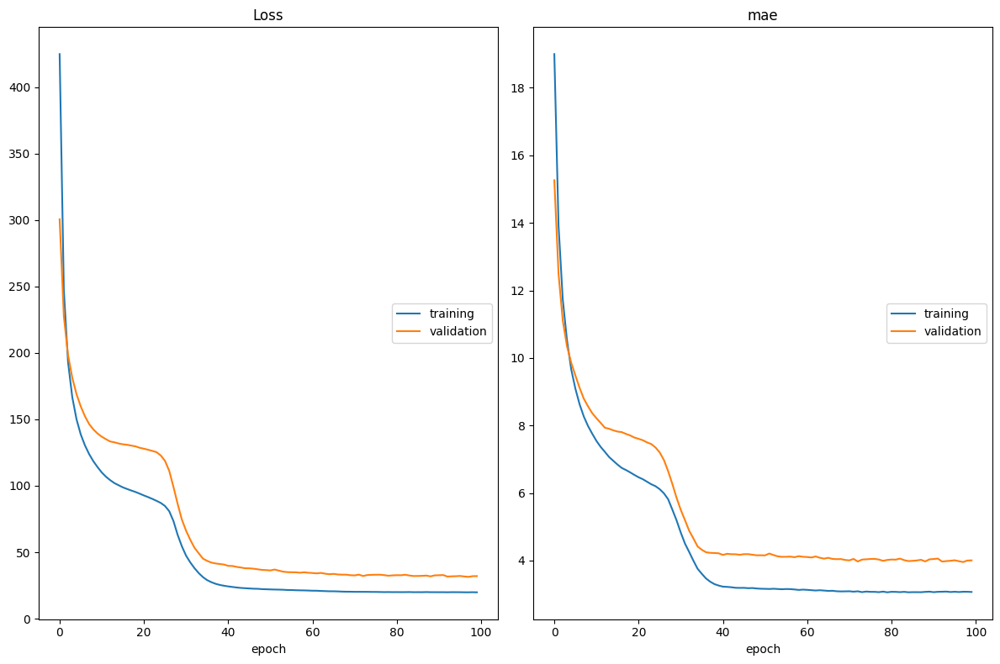

Loss
	training         	 (min:   19.846, max:  424.755, cur:   19.846)
	validation       	 (min:   31.466, max:  300.494, cur:   32.028)
mae
	training         	 (min:    3.060, max:   18.999, cur:    3.070)
	validation       	 (min:    3.956, max:   15.263, cur:    4.005)
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 18.7407 - mae: 2.9109 - val_loss: 32.0282 - val_mae: 4.0047


In [15]:
# Perceptron
model=Sequential()

model.add(Input(shape=(12,),name="Input Layer"))

model.add(Dense(1,activation='relu',name='OutputLayer'))
t1 = tf.keras.optimizers.SGD()
model.compile(loss='mse',optimizer=t1,metrics=['mae'])

# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

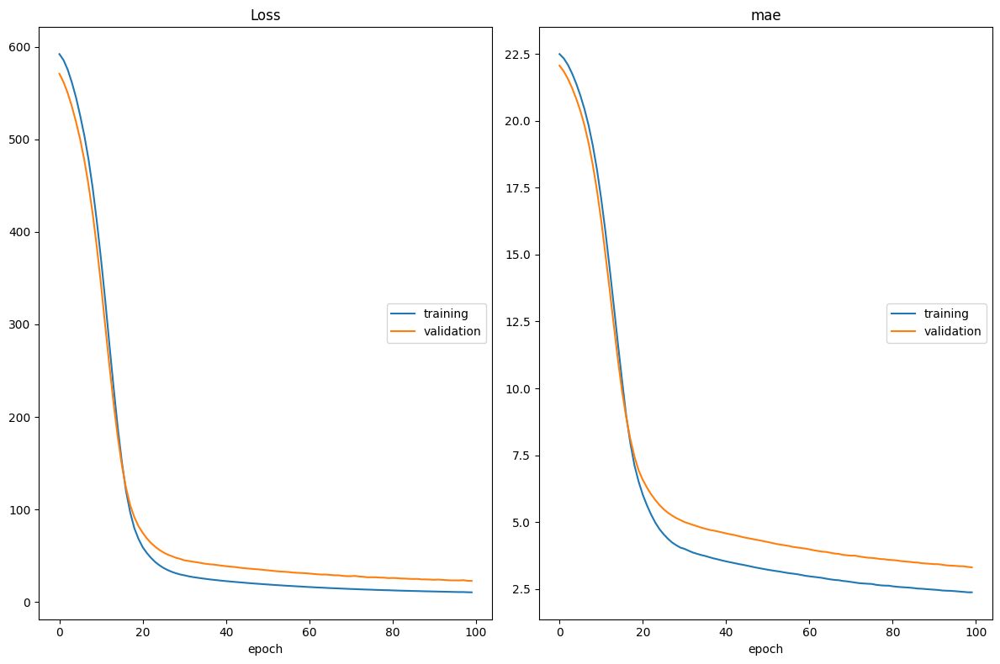

Loss
	training         	 (min:   10.590, max:  591.995, cur:   10.590)
	validation       	 (min:   22.918, max:  570.709, cur:   22.918)
mae
	training         	 (min:    2.380, max:   22.491, cur:    2.380)
	validation       	 (min:    3.313, max:   22.060, cur:    3.313)
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 10.1981 - mae: 2.3951 - val_loss: 22.9180 - val_mae: 3.3128


In [ ]:
# Deep Neural Network
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))

model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))

model.add(Dense(1,activation='relu',name='OutputLayer'))

model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

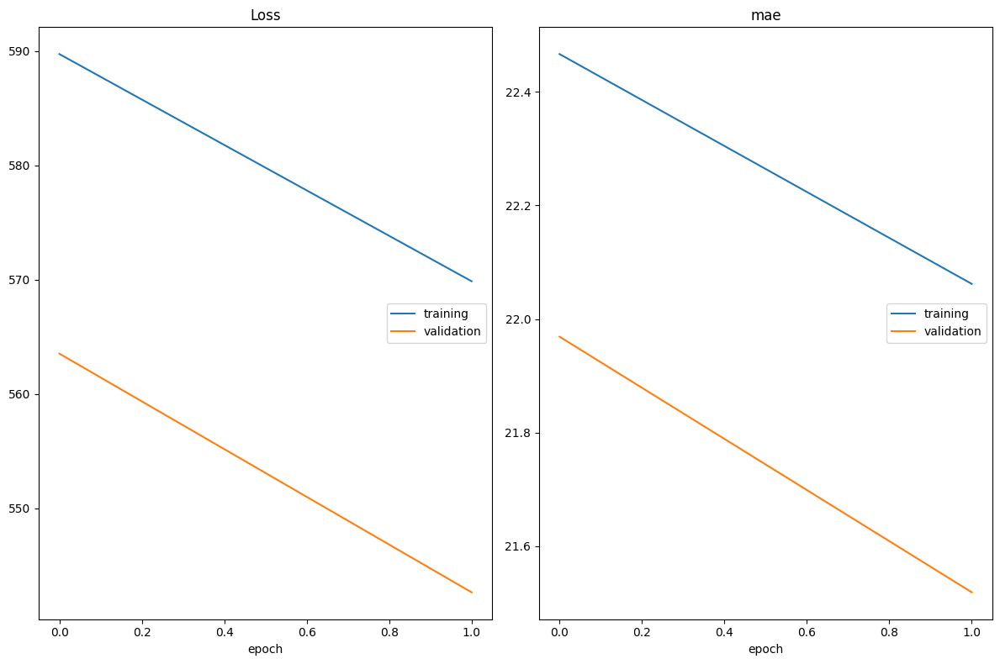

Loss
	training         	 (min:  569.871, max:  589.739, cur:  569.871)
	validation       	 (min:  542.668, max:  563.541, cur:  542.668)
mae
	training         	 (min:   22.062, max:   22.467, cur:   22.062)
	validation       	 (min:   21.519, max:   21.969, cur:   21.519)
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 579.6183 - mae: 22.2844 - val_loss: 542.6679 - val_mae: 21.5189
Epoch 3/100


KeyboardInterrupt: 

In [ ]:
# Increase number of layers
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))

model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(25,activation='relu',name="Hidden3"))
model.add(Dense(30,activation='relu',name="Hidden4"))

model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [ ]:
model.predict(x_test_std)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


array([[0.990449  ],
       [0.53554296],
       [0.3026785 ],
       [0.34106994],
       [0.5815081 ],
       [0.6990718 ],
       [0.58360404],
       [0.8717645 ],
       [0.52336246],
       [0.7149689 ],
       [0.86147815],
       [0.42596793],
       [0.38307613],
       [0.41783705],
       [0.7898233 ],
       [2.0387268 ],
       [0.7279435 ],
       [2.3191226 ],
       [0.6228063 ],
       [0.6674931 ],
       [0.6115188 ],
       [0.23802331],
       [0.732762  ],
       [1.0912881 ],
       [0.91317993],
       [0.60743904],
       [0.86118627],
       [0.6143745 ],
       [0.69389784],
       [0.6165855 ],
       [0.36672637],
       [0.26883236],
       [1.0039908 ],
       [1.1673356 ],
       [0.7307437 ],
       [0.3047933 ],
       [0.34979442],
       [0.36464477],
       [0.38584837],
       [0.22880383],
       [1.0721977 ],
       [0.8292181 ],
       [1.0090858 ],
       [0.2962327 ],
       [1.1107138 ],
       [0.74269456],
       [0.8667259 ],
       [0.589

In [ ]:
y_test

,HOUSEPRICE
329,22.6
371,50.0
219,23.0
403,8.3
78,21.2
...,...
49,19.4
498,21.2
309,20.3
124,18.8


In [16]:
# save model
model.save("BostonModel.h5")

In [17]:
import tensorflow as tf
from tensorflow import keras
from keras.losses import MeanSquaredError # Import the Mean Squared Error loss function explicitly

loaded_model = tf.keras.models.load_model('BostonModel.h5', custom_objects={'mse': MeanSquaredError})

In [18]:
loaded_model.predict(x_test_std)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


array([[26.905418 ],
       [24.199146 ],
       [27.710571 ],
       [12.2709675],
       [22.387812 ],
       [20.77496  ],
       [21.204536 ],
       [22.4796   ],
       [19.549932 ],
       [20.104591 ],
       [ 3.7270355],
       [15.257534 ],
       [17.827477 ],
       [ 5.126812 ],
       [39.46087  ],
       [34.070564 ],
       [22.99826  ],
       [38.412193 ],
       [32.47474  ],
       [24.32911  ],
       [26.16011  ],
       [25.255236 ],
       [21.543703 ],
       [31.326649 ],
       [23.292877 ],
       [ 8.896106 ],
       [18.643927 ],
       [19.698086 ],
       [37.376945 ],
       [21.796133 ],
       [18.496342 ],
       [18.847586 ],
       [20.747192 ],
       [24.559616 ],
       [30.0626   ],
       [17.95397  ],
       [11.2125435],
       [22.838804 ],
       [16.785494 ],
       [15.039606 ],
       [27.19935  ],
       [21.62031  ],
       [24.10539  ],
       [15.313236 ],
       [25.362719 ],
       [26.18916  ],
       [20.439434 ],
       [22.40